In [1]:
import pandas as pd
import numpy as np

In [7]:
df=pd.read_csv("unprocessed.csv")


In [3]:
df.head()

,aspect,burned_areas,curvature,d2m,dem,ignition_points,ndvi,rh,roads_distance,slope,...,month,day,day_of_year,week_of_year,quarter,month_sin,month_cos,day_of_year_sin,day_of_year_cos,target
0,-0.023376,-0.087595,-0.152924,0.749859,-1.210648,-0.011168,-1.306742,-0.838179,-0.457263,-0.322125,...,7,29,210,30,3,-0.500000,-0.866025,-0.455907,-0.890028,1
1,-0.023376,-0.087595,-0.152924,0.806068,-1.210648,-0.011168,-1.306742,-0.837083,-0.457263,-0.322125,...,7,30,211,30,3,-0.500000,-0.866025,-0.471160,-0.882048,1
2,-0.023376,-0.087595,-0.152924,0.822762,-1.210648,-0.011168,-1.306742,-0.395334,-0.457263,-0.322125,...,7,31,212,31,3,-0.500000,-0.866025,-0.486273,-0.873807,1
3,-0.023376,-0.087595,-0.152924,0.828469,-1.210648,-0.011168,-1.306742,-0.649035,-0.457263,-0.322125,...,8,1,213,31,3,-0.866025,-0.500000,-0.501242,-0.865307,1
4,-0.023376,-0.087595,-0.152924,0.854087,-1.210648,-0.011168,-1.306742,-0.260139,-0.457263,-0.322125,...,8,2,214,31,3,-0.866025,-0.500000,-0.516062,-0.856551,1


In [4]:
df.columns

Index(['aspect', 'burned_areas', 'curvature', 'd2m', 'dem', 'ignition_points',
       'ndvi', 'rh', 'roads_distance', 'slope', 'sp', 'ssrd', 't2m', 'tp',
       'wind_direction', 'wind_speed', 'x', 'y', 'lc_agriculture', 'lc_forest',
       'lc_grassland', 'lc_settlement', 'lc_shrubland', 'lc_sparse_vegetation',
       'lc_water_bodies', 'lc_wetland', 'population', 'burned_area_has',
       'time_idx', 'sample', 'year', 'month', 'day', 'day_of_year',
       'week_of_year', 'quarter', 'month_sin', 'month_cos', 'day_of_year_sin',
       'day_of_year_cos', 'target'],
      dtype='object')

**Temporal Trends (Burned Areas over time)**

In [10]:
import plotly.express as px

df_grouped = df.groupby('year')['burned_areas'].sum().reset_index()

fig = px.line(df_grouped, x='year', y='burned_areas', 
              title='Yearly Burned Area Trends', markers=True)
fig.show()


**Monthly  Burned Areas**

In [11]:
df['month_year'] = df['year'].astype(str) + '-' + df['month'].astype(str)
df_grouped = df.groupby('month_year')['burned_areas'].sum().reset_index()

fig = px.bar(df_grouped, x='month_year', y='burned_areas',
             title='Monthly Burned Area Trends', color='burned_areas')
fig.show()


**Geospatial  Analysis ( WildFire Mapping)**

In [17]:
# Filter out rows with missing or invalid lat/lon values
df_filtered = df[(df['x'].notna()) & (df['y'].notna()) & 
                 (df['x'] != 0) & (df['y'] != 0)]

# Scatter mapbox with only valid coordinates
fig = px.scatter_mapbox(df_filtered, lat='y', lon='x', color='burned_areas',
                        title='Wildfire Locations', size_max=10, zoom=5)

fig.update_layout(mapbox_style='open-street-map')
fig.show()


C:\Users\hp\AppData\Local\Temp\ipykernel_15568\469185417.py:6: DeprecationWarning:

*scatter_mapbox* is deprecated! Use *scatter_map* instead. Learn more at: https://plotly.com/python/mapbox-to-maplibre/



In [15]:
fig = px.density_mapbox(df, lat='y', lon='x', z='burned_areas',
                        radius=10, title='Fire Intensity Heatmap')
fig.update_layout(mapbox_style='carto-darkmatter')
fig.show()


C:\Users\hp\AppData\Local\Temp\ipykernel_15568\3088894093.py:1: DeprecationWarning:

*density_mapbox* is deprecated! Use *density_map* instead. Learn more at: https://plotly.com/python/mapbox-to-maplibre/



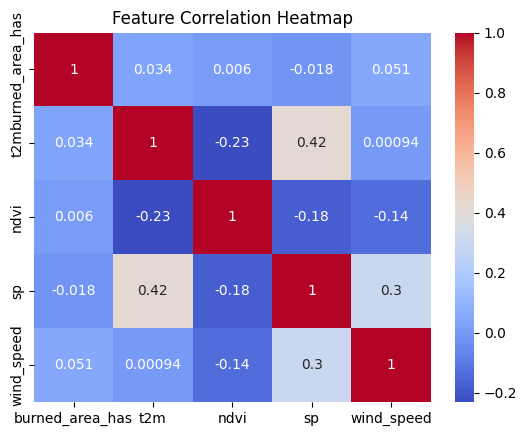

In [18]:
import seaborn as sns
import matplotlib.pyplot as plt

corr = df[['burned_area_has', 't2m', 'ndvi', 'sp', 'wind_speed']].corr()
sns.heatmap(corr, annot=True, cmap='coolwarm')
plt.title("Feature Correlation Heatmap")
plt.show()


In [21]:
fig = px.scatter(df, x='wind_speed', y='burned_area_has', title='Wind Speed vs Burned Area')
fig.show()


**Geospatial Fire Spread Over Time (Animated Map)**

In [22]:
import plotly.express as px

fig = px.scatter_mapbox(
    df,
    lat='y',
    lon='x',
    size='burned_areas',
    color='burned_areas',
    animation_frame='year',  # Change over time
    title="Wildfire Spread Over Time",
    mapbox_style="open-street-map"
)

fig.show()


C:\Users\hp\AppData\Local\Temp\ipykernel_15568\2904752464.py:3: DeprecationWarning:

*scatter_mapbox* is deprecated! Use *scatter_map* instead. Learn more at: https://plotly.com/python/mapbox-to-maplibre/



**Heatmap of Burned Areas vs. Terrain Features**

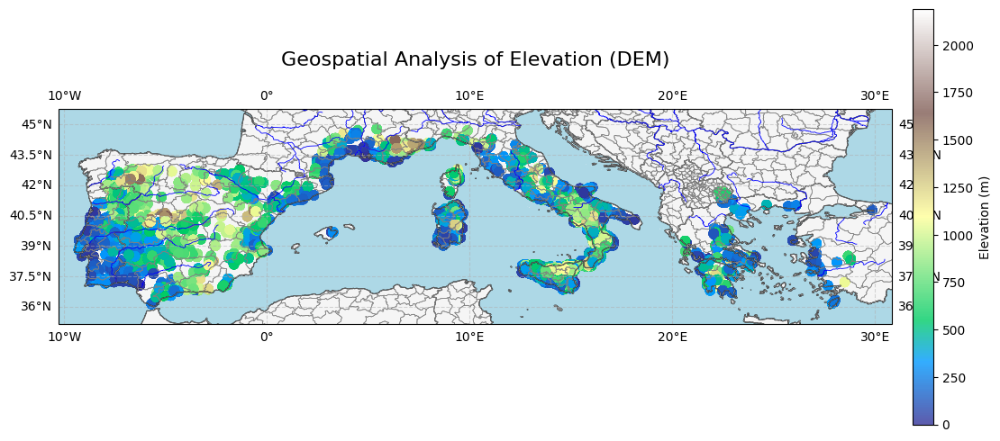

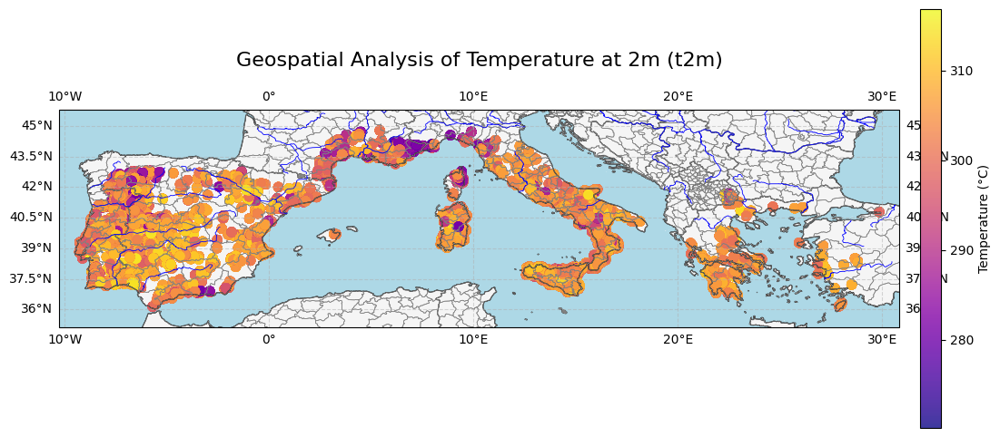

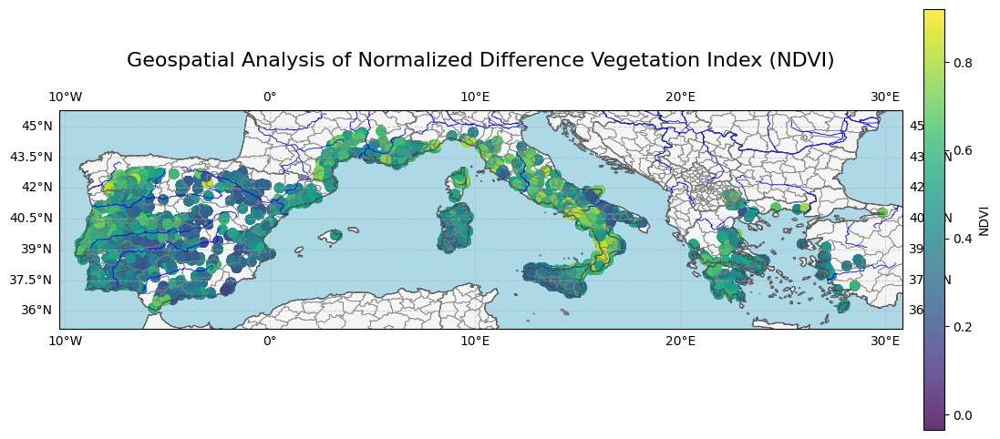

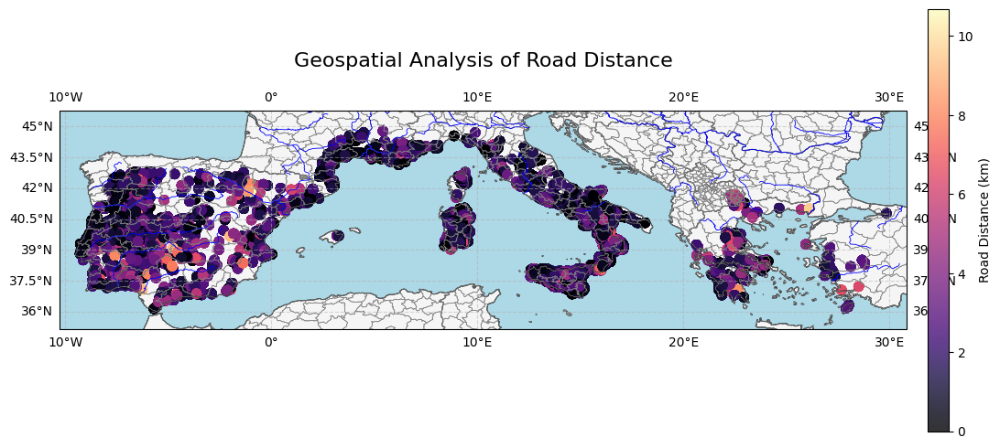

In [37]:
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature

# List of metrics to plot
metrics = [
    {'column': 'dem', 'label': 'Elevation (m)', 'cmap': 'terrain', 'title': 'Elevation (DEM)'},
    {'column': 't2m', 'label': 'Temperature (°C)', 'cmap': 'plasma', 'title': 'Temperature at 2m (t2m)'},
    {'column': 'ndvi', 'label': 'NDVI', 'cmap': 'viridis', 'title': 'Normalized Difference Vegetation Index (NDVI)'},
    {'column': 'roads_distance', 'label': 'Road Distance (km)', 'cmap': 'magma', 'title': 'Road Distance'}
]

# Create a separate map for each metric
for metric in metrics:
    # Create Figure and Axes with Cartopy
    fig, ax = plt.subplots(figsize=(12, 8), subplot_kw={'projection': ccrs.PlateCarree()})
    
    # Set map extent based on data
    ax.set_extent([df['x'].min()-1, df['x'].max()+1, df['y'].min()-1, df['y'].max()+1], crs=ccrs.PlateCarree())
    
    # Add map features
    ax.add_feature(cfeature.COASTLINE, linewidth=0.8, edgecolor='black')
    ax.add_feature(cfeature.BORDERS, linewidth=0.8, edgecolor='black')
    ax.add_feature(cfeature.STATES, linewidth=0.5, edgecolor='gray')  # Add state boundaries
    ax.add_feature(cfeature.LAND, facecolor='whitesmoke')
    ax.add_feature(cfeature.OCEAN, facecolor='lightblue')
    ax.add_feature(cfeature.RIVERS, edgecolor='blue', linewidth=0.6)
    
    # Scatter Plot for the current metric
    sc = ax.scatter(df['x'], df['y'], c=df[metric['column']], cmap=metric['cmap'], alpha=0.8, s=50, marker='o', transform=ccrs.PlateCarree())
    
    # Colorbar
    cb = plt.colorbar(sc, ax=ax, shrink=0.6, pad=0.02, label=metric['label'])
    
    # Labels & Title
    plt.title(f"Geospatial Analysis of {metric['title']}", fontsize=16, fontweight='bold', pad=20)
    plt.xlabel("Longitude", fontsize=12, labelpad=10)
    plt.ylabel("Latitude", fontsize=12, labelpad=10)
    
    # Gridlines
    ax.gridlines(draw_labels=True, linestyle='--', alpha=0.5)
    
    # Adjust layout
    plt.tight_layout()
    
    # Show Plot
    plt.show()